# Welcome to the Noah-MP LSM Short Course at AMS 2024

This notebook is for the Noah-MP LSM short course at AMS 2024
See AMS course page:
https://www.ametsoc.org/index.cfm/ams/education-careers/careers/professional-development/short-courses/noah-mp-land-surface-model-tutorial-model-physics-code-structures-and-simulation-exercises/

See course page at NCAR RAL:
https://ral.ucar.edu/events/2024/ams-2024-short-course-noah-mp-land-surface-model-tutorial

See course agenda: 
https://www.ametsoc.org/index.cfm/ams/education-careers/careers/professional-development/short-courses/noah-mp-land-surface-model-tutorial-model-physics-code-structures-and-simulation-exercises/noah-mp-short-course-agenda/

Contact information:
Dr. Cenlin He (NSF NCAR) <cenlinhe@ucar.edu>

Dr. Zhe Zhang (NSF NCAR) <zhezhang@ucar.edu>

Dr. Ufuk Turuncoglu (NSF NCAR) <turuncu@ucar.edu>

Dr. Ronnie Abolafia-Rosenzweig (NSF NCAR) <abolafia@ucar.edu>

Dr. Tzu-Shun Lin (NSF NCAR) <tslin2@ucar.edu>

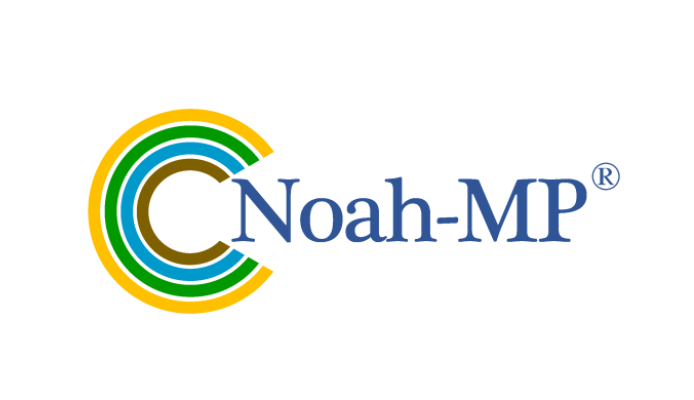

## 0. Start the Docker

Once you have finished download, install, and setup of the Docker Container, you can start to run the Docker:

`docker run --platform linux/amd64 -e DISPLAY=host.docker.internal:0 --net host -it cenlinhe/noahmp_container:AMS_course`

The Docker will start running and you can check your path and file, with `pwd` and `ls`, then you will see this folder `AMS_shortcourse`
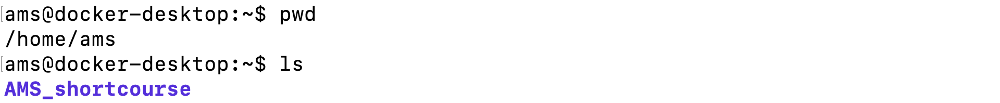

Then we can start the tutorial from here with downloading the model code from GitHub Repo. 

#### Also, this tutorial requires editting documents on linux machine using Vim editor, please see this link for examples

https://coderwall.com/p/adv71w/basic-vim-commands-for-getting-started

## 1. Download HRLDAS/Noah-MP code from GitHub repo


We use the GitHub online platform to manage both HRLDAS and NoahMP code. Please see their links in:

**HRLDAS: https://github.com/NCAR/hrldas**
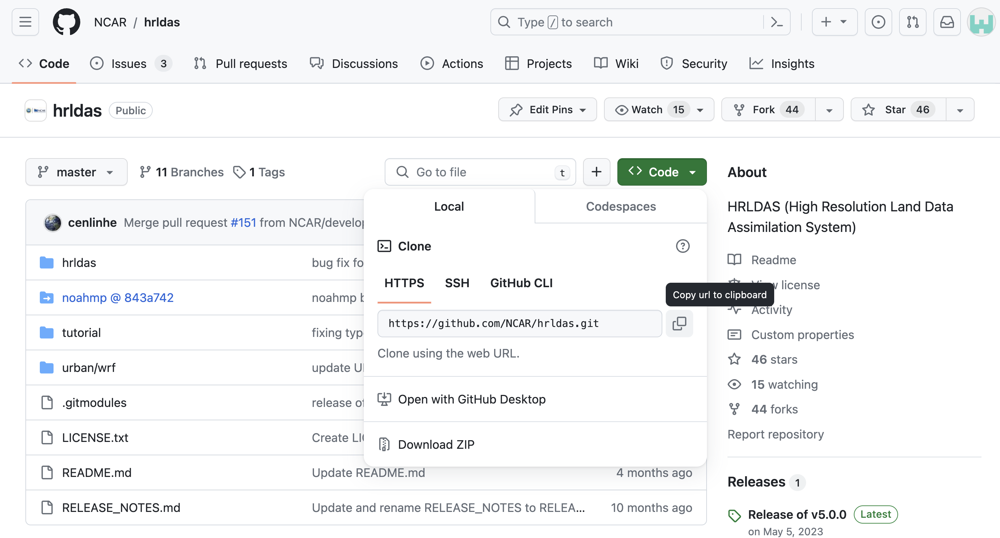

**High-Resolution Land Data Assimilation System**: is the driver for Noah-MP LSM and Noah-MP repo is linked as a submodule within HRLDAS repo.

**Noah-MP: https://github.com/NCAR/noahmp**
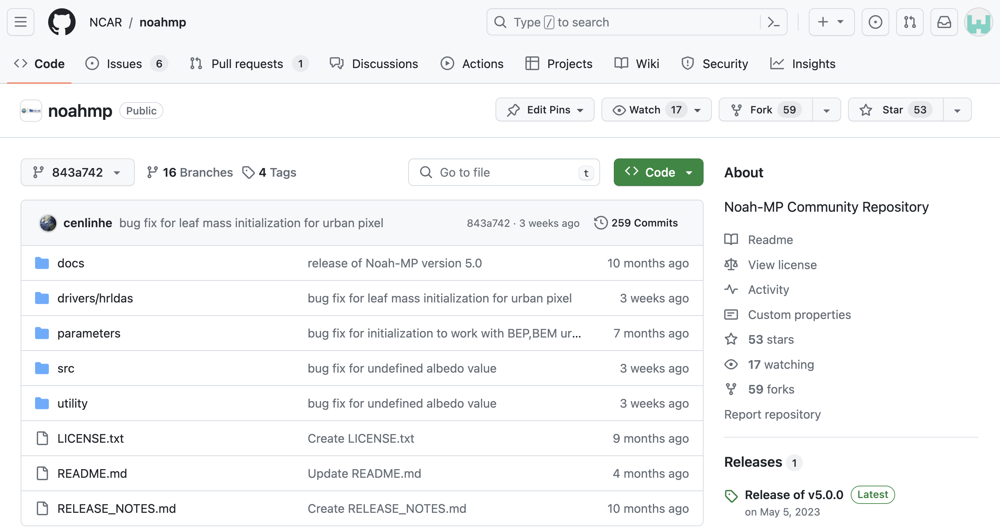



### Download the model code
We encourage obtaining a copy of the model source code from the GitHub repository, with the "git clone" command. Since the NoahMP model is organized as a submodule under the HRLDAS driver, don't forget to use "--submodule" option when making the copy:

**git clone --recurse-submodules https://github.com/NCAR/hrldas**

Remember to add this option, "--recurse-submodules", to include noahmp as a submodule. If it is not specified, the Noah-MP source code will not be downloaded.

By running the command above, you will get the following message:

 **ls -l hrldas** and check the **hrldas** directory: 
 
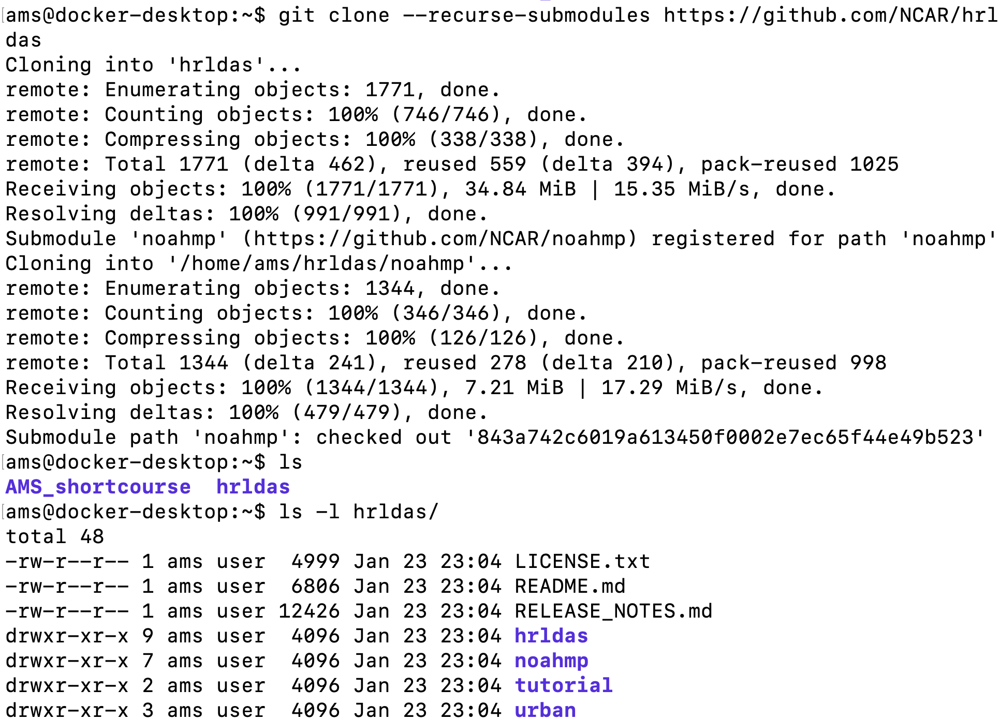

There you go! It is a very simple way to download the latest version of the HRLDAS/NoahMP model source code.

# 2. Compiling the Model Code

Now we can start configure and compile the model.

**cd ./hrldas/hrldas**

**ls -l**
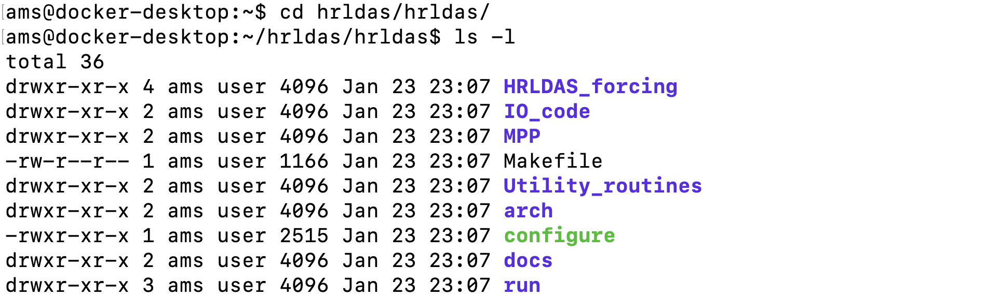

Start with **./configure** 
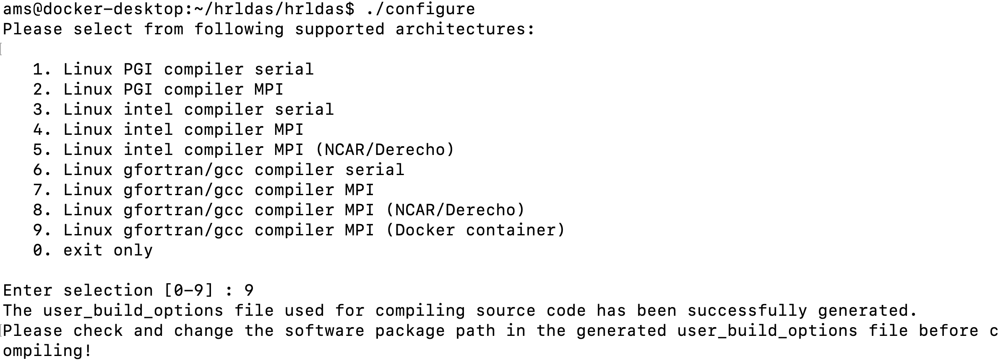

Type your compiler option in number in the command line. We have already created a specific configuration (9) for use in Docker container, so we will use this one (gfortran/gcc).

A configuration file **user_build_options** will appear in the directory. Go into the file and edit the correct path to necessary libraries. 

For building HRLDAS & NoahMP, two libraries are necessary, **netcdf** and **jpeg2000**. Please specify their paths in the **user_build_options** file. Here is an example how this file look like:
**cat user_build_options**
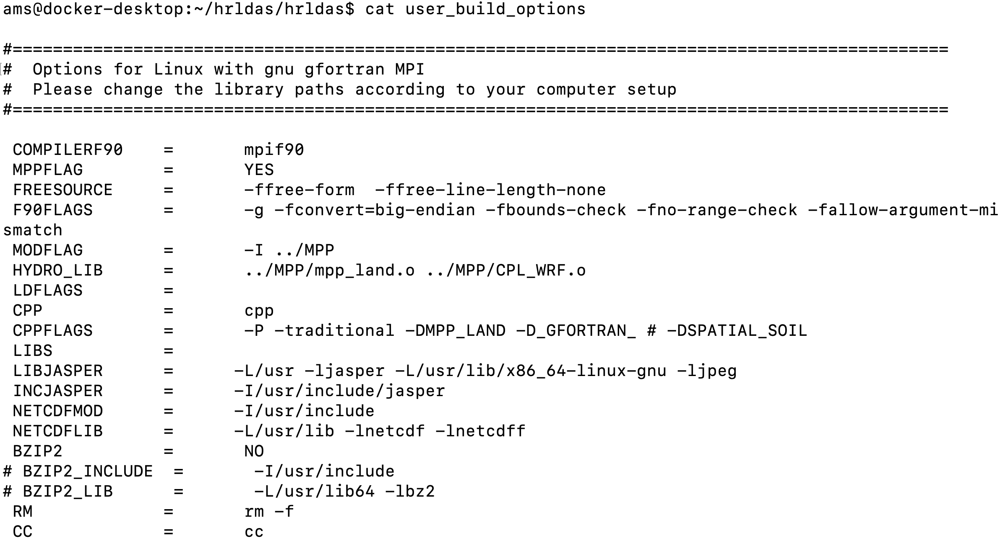


Modify the paths for **LIBJASPER** and **INCJASPER** for jasper and **NETCDFMOD** and **NETCDFLIB** for netCDF library if you want to work on your HPC system. 

After editing the **user_build_options** file, we can now compile the model with a simple command: 

**make** 

and the model will start compiling through each module file. If you want to save the compilation log, you can run this:

**make >& compile.log** 

Search through the **compile.log** file, if there isn't any **"Error"** message, and two executables are successfully built: **hrldas.exe** in **run** directory and **create_forcing.exe** in **HRLDAS_forcing** directory.

**ls -l ./run**
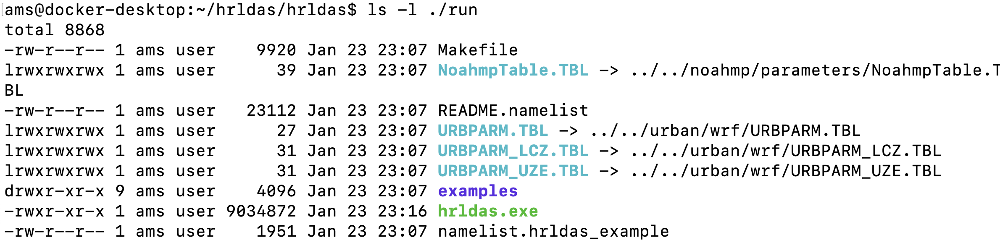

**ls -l ./HRLDAS_forcing**
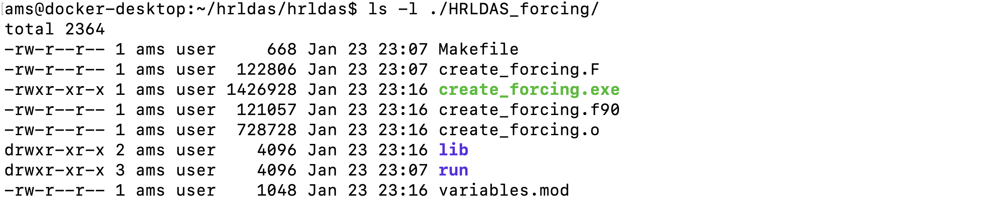

### Congratulations! You have successfully built the HRLDAS/Noah-MP model!

# 3. Test run with Single Point simulation

The single-point simulation runs at an Ameriflux site in Bondville, IL, for one year 

A written documentation for running the single-point case is also provided under ./hrldas/hrldas/docs/README.single_point: https://github.com/NCAR/hrldas/blob/master/hrldas/docs/README.single_point

You can find the single-point forcing data located in this directory:

`ls -l ./HRLDAS_forcing/run/examples/single_point/`

`cd ./HRLDAS_forcing/run/examples/single_point/`

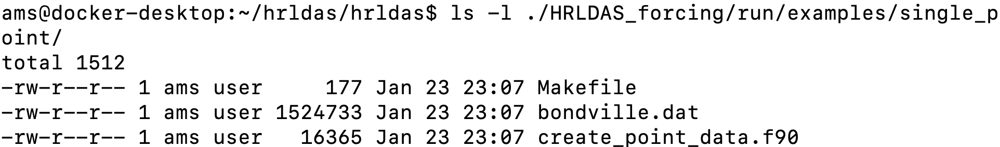

and view the data format written for the Bondville site in `bondville.dat`:
https://github.com/NCAR/hrldas/blob/master/hrldas/HRLDAS_forcing/run/examples/single_point/bondville.dat

The first section about location info, the second section about initial conditions (snow, soil mositure/temperature, canopy water, etc.), the third section about meta data, the fourth section about unit conversion, and then 30-min data for bondville in 1998. 

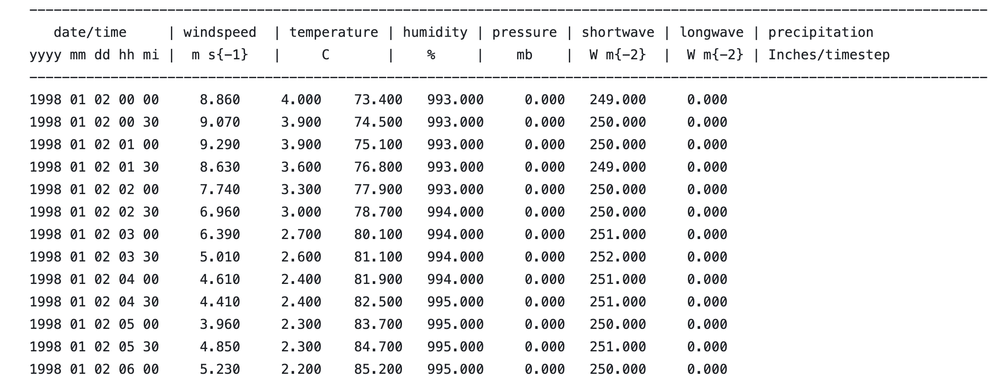

Given this format, you can substitute data from other stations you have, then run Noah-MP anywhere else. 

## Compile the create_point_data.f90 code to generate single-point forcing
Run `make` on the command line:
Then you will see an executable "create_point_data.exe".
Run this executable to generate forcing data:

`./create_point_data.exe`

You will see the code running:

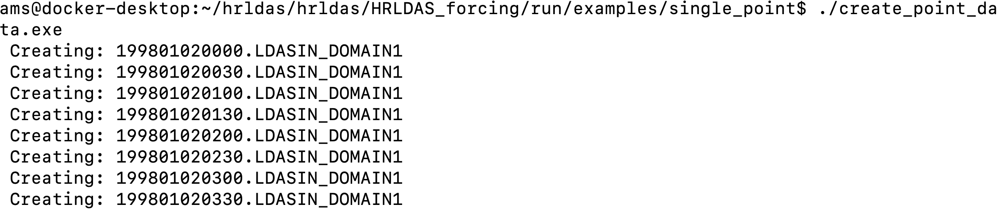

By the end, you will have 30-min data "199801020000.LDASIN_DOMAIN1" ... and the "hrldas_setup_single_point.nc" for initial conditions. 

## Run single-point simulation 
Now we have the forcing data and initial conditions, we can go back to the run directory and run this case.

`cd ../../../../`

`pwd`

`/home/ams/hrldas/hrldas`

`cp -r run run_single_point`

`cd run_single_point`

`ls`

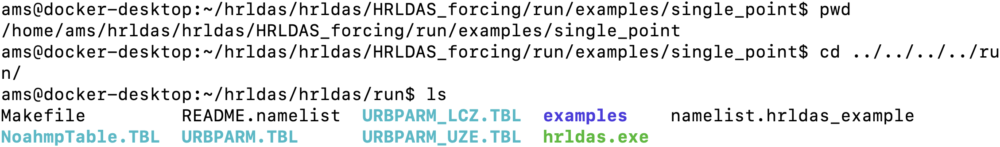

Then you can edit a namelist for this single-point run:

`cp examples/single_point/namelist.hrldas.single_point namelist.hrldas`

`vi namelist.hrldas`

Remember to change the simulation start date to `1998-01-02`:

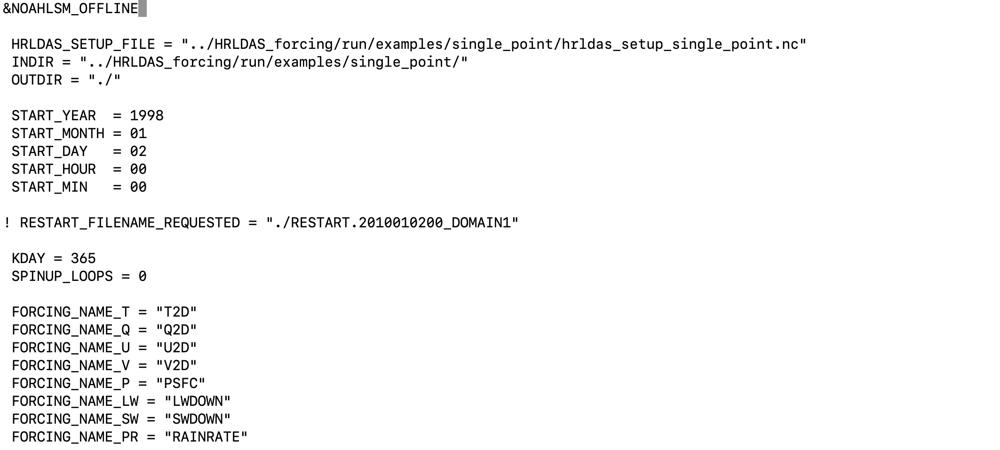

Here you want to modify the start data as it starts from 1998-01-02 and the output options `SPLIT_OUTPUT_COUNT` & `RESTART_FREQUENCY_HOURS`. Here you can set it to very large (999999).

Then you can run the single-point simulation:

`./hrldas.exe` 

and the model starts running:

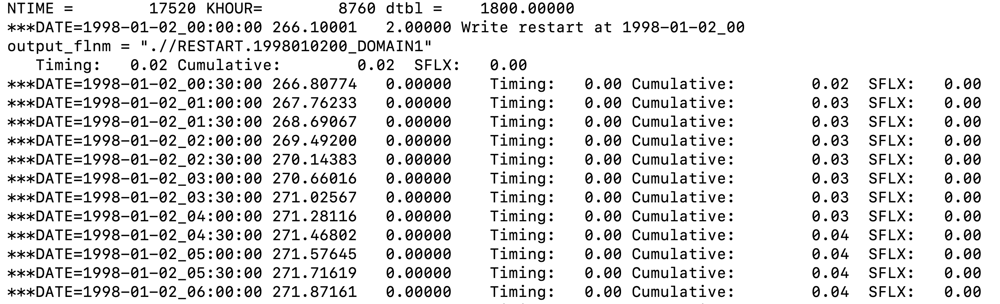

and the output will be in:

`199801020030.LDASOUT_DOMAIN1`

Now you can quickly visualize it by running `ncview`:

`ncview 199801020030.LDASOUT_DOMAIN1`

and select `LH` for latent heat flux for example:

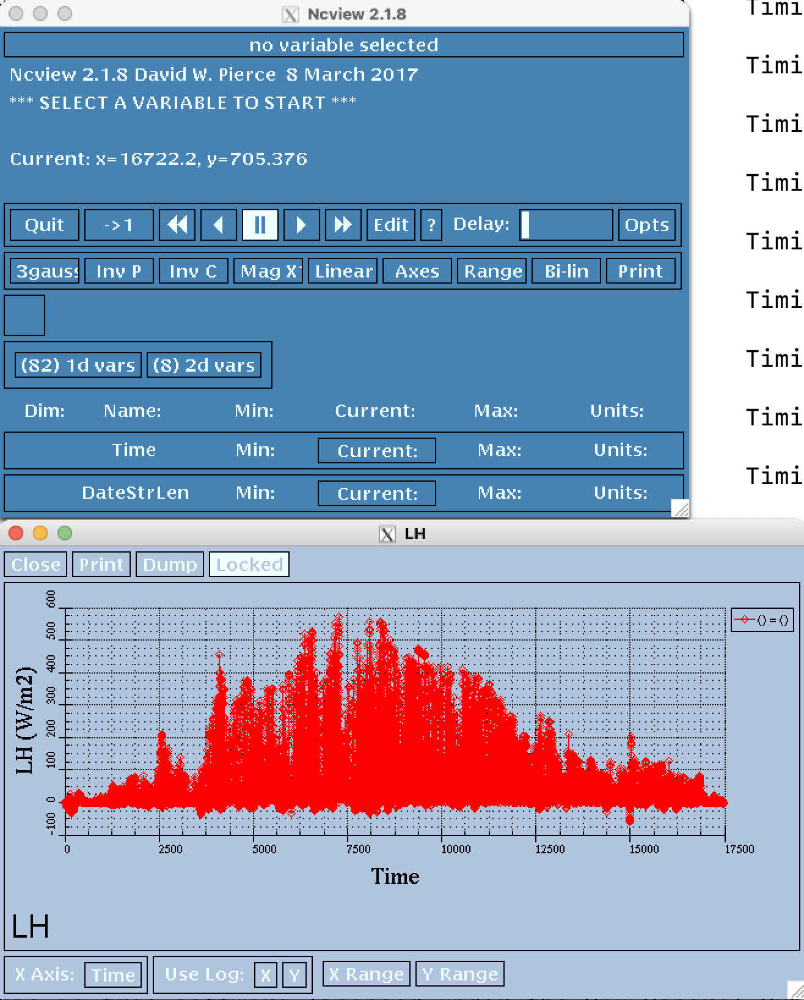

This will give you 30-m timeseries of LH for this single-point simulation. 

### Congratulations! You have successfully finished the single-point simulation!

# 3. Test run with 2D regional domain (with ERA5-Land forcing)

Then we can start the 2D regional simulation with ERA5-Land data. We have already downloaded the data and stored on the docker.

## Download ERA5-Land forcing data

`ls /home/ams/AMS_shortcourse/ERA5-Land/`

For your future simulation, you can download the ERA5-Land data from:
https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land?tab=form

You will select 8 variables for the forcing data and 4 variables for initial conditions:

Forcing data variables:

`2m dewpoint temperature`

`2m tempearture`

`Surface solar radiation downwards`

`Surface thermal radiation downwards`

`10m u-component wind`

`10m v-component wind`

`Surface pressure`

`Total precipitation`

Initial conditions:

`Skin temperature`

`Soil temperature` * 4 levels

`Volumetric soil water` * 4 levels

`Snow depth water equivalent`

### For our test case, we already downloaded the ERA5-Land data for 3 days. 

see `ls /home/ams/AMS_shortcourse/ERA5-Land/`

`ERA5-Land-Noah-MP-2023-11-01.grib` for three day forcing.

`ERA5-Land-Noah-MP-2023-10-31.grib` forcing from the day before is needed to calculate radiation fluxes. 

`ERA5-Land-Noah-MP-2023-11-01_INIT.grib` for initial conditions.

## Extract forcing data 

Now get back to the hrldas directory and extract data from the `HRLDAS_forcing` directory:

`cd /home/ams/hrldas/hrldas/`

`cd ./HRLDAS_forcing/run/examples/ERA5`

`ls -l`

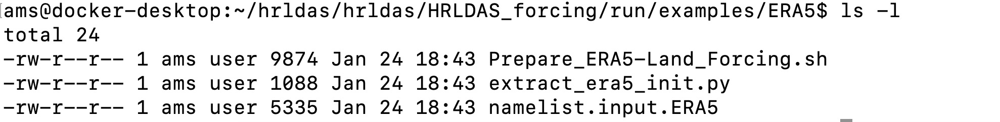

first, edit the shell code:

`vi Prepare_ERA5-Land_Forcing.sh`

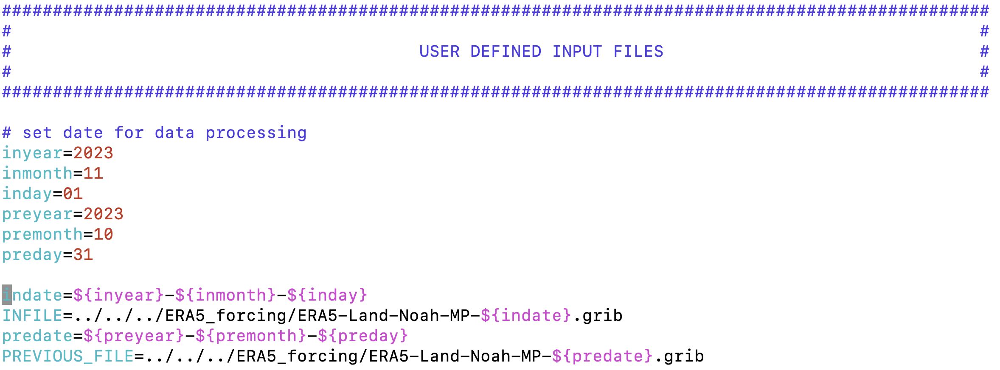

Define the path of this section:

`INFILE=/home/ams/AMS_shortcourse/ERA5-Land/ERA5-Land-Noah-MP-${indate}.grib`

`PREVIOUS_FILE=/home/ams/AMS_shortcourse/ERA5-Land/ERA5-Land-Noah-MP-${predate}.grib`


Then run this shall code:

`bash Prepare_ERA5-Land_Forcing.sh`

The code runs like this:
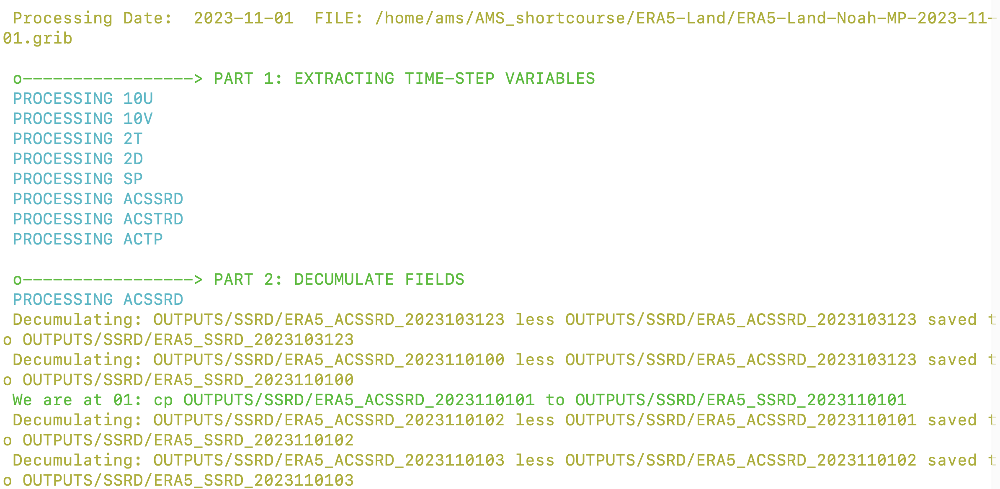

## Extract Initial conditions
Edit the `extract_era5_init.py` code

`vi extract_era5_init.py`

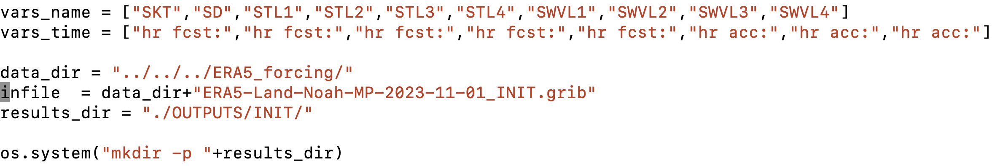

`data_dir = "/home/ams/AMS_shortcourse/ERA5-Land/"`

Then run this python code:

`python3 extract_era5_init.py`

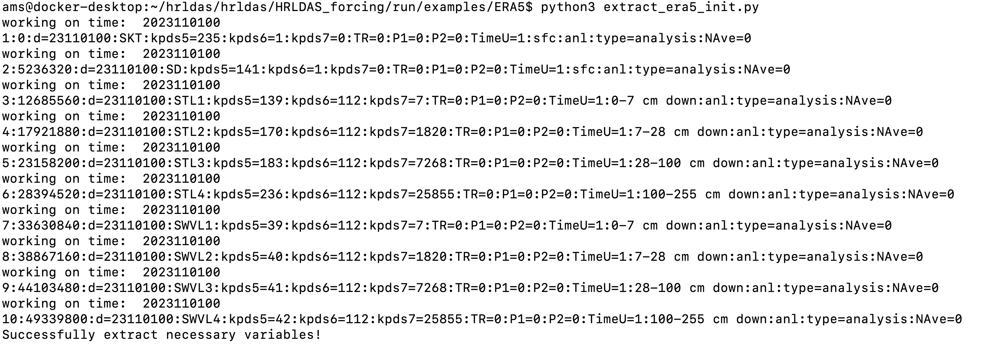

## Generate forcing data for Noah-MP
Go back to `HRLDAS_forcing` level and edit namelist

`cd /home/ams/hrldas/hrldas/HRLDAS_forcing/`

`cp run/examples/ERA5/namelist.input.ERA5 .`

`vi namelist.input.ERA5`

Specify the path to previously extracted data and initial conditions:

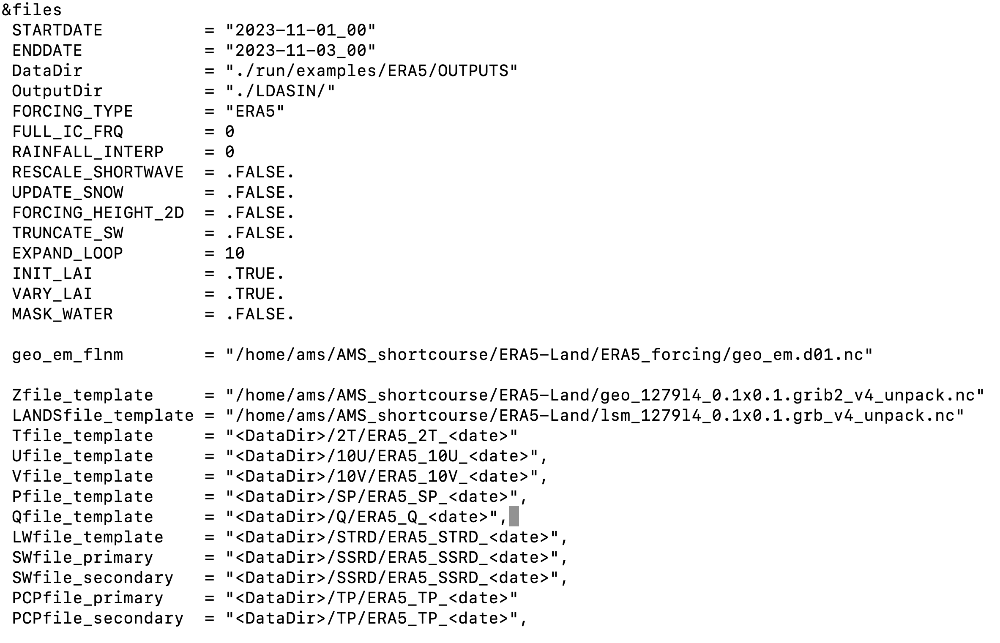

` geo_em_flnm        = "/home/ams/AMS_shortcourse/ERA5-Land/geo_em.d01.nc"`

` Zfile_template     = "/home/ams/AMS_shortcourse/ERA5-Land/geo_1279l4_0.1x0.1.grib2_v4_unpack.nc"`

` LANDSfile_template = "/home/ams/AMS_shortcourse/ERA5-Land/lsm_1279l4_0.1x0.1.grb_v4_unpack.nc"`

Create a directory for forcing output `LDASIN`

`mkdir LDASIN`

Then run `create_forcing.exe` to generate forcing:

`./create_forcing.exe namelist.input.ERA5`
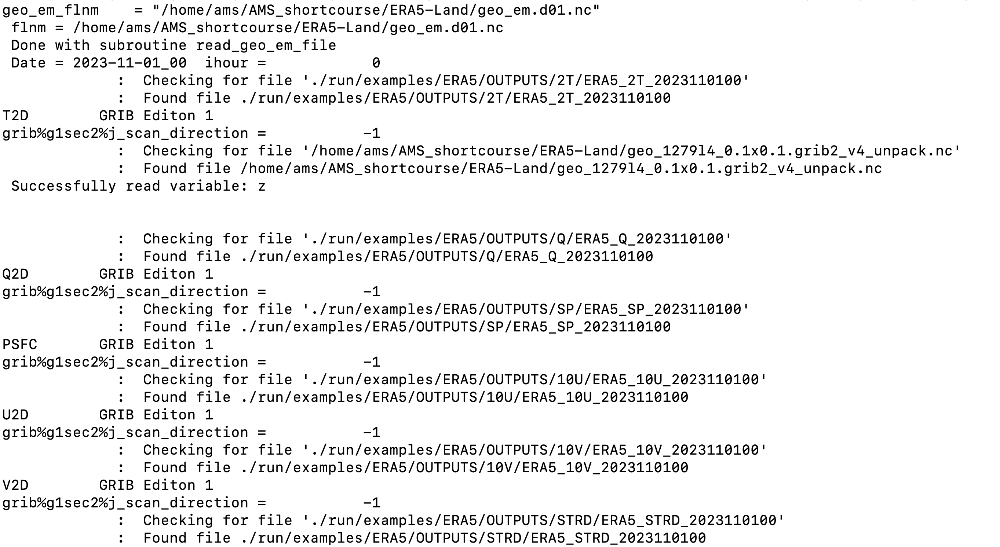

After running the `create_forcing.exe`, check forcing output at `./LDASIN/`

`ls /LDASIN/`

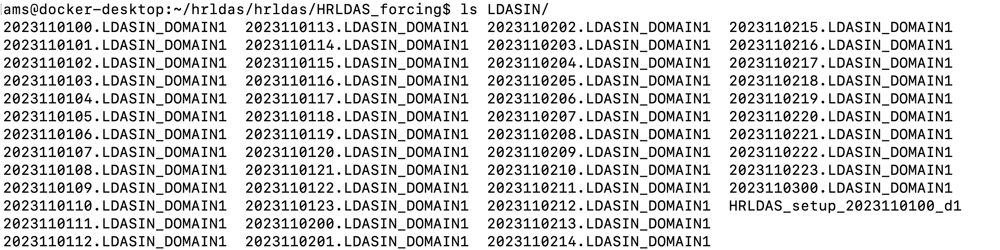

## Run hrldas.exe with ERA5-Land forcing

Now we can get into the run directory:

`cd /home/ams/hrldas/hrldas/`

`cp -r run run_2D_domain`

`cd run_2D_domain`

`cp examples/ERA5/namelist.hrldas/ERA5 namelist.hrldas`

Edit the namelist: 
`vi namelist.hrldas`

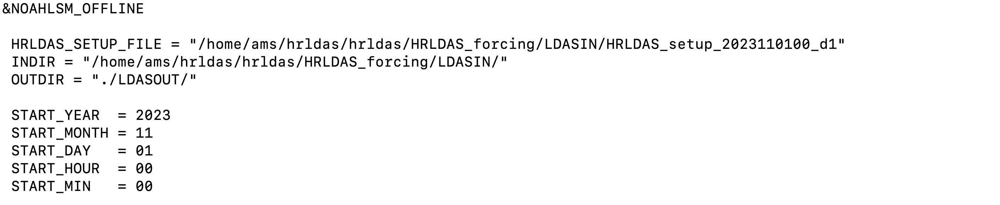

Also modify the output options:
` SPLIT_OUTPUT_COUNT = 24`

` RESTART_FREQUENCY_HOURS = 24`

Create an output directory: `mkdir LDASOUT`

Run the model: `./hrldas.exe`

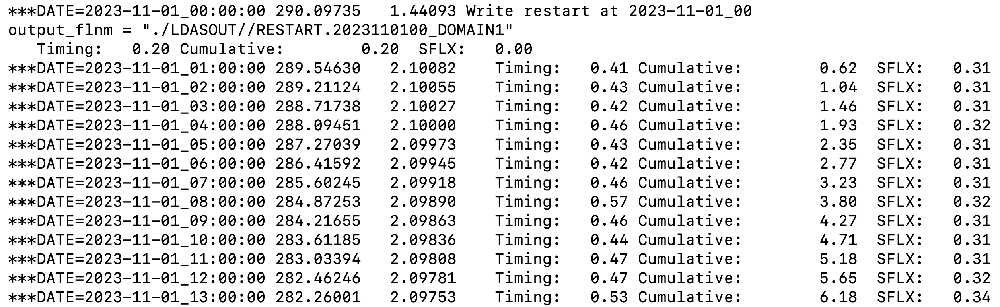

Check output files: `ls -l LDASOUT`
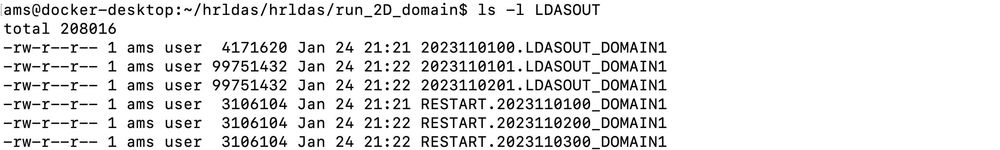

Visualize model output: `ncview 2023110101.LDASOUT_DOMAIN1`
Let's check for `LH`:

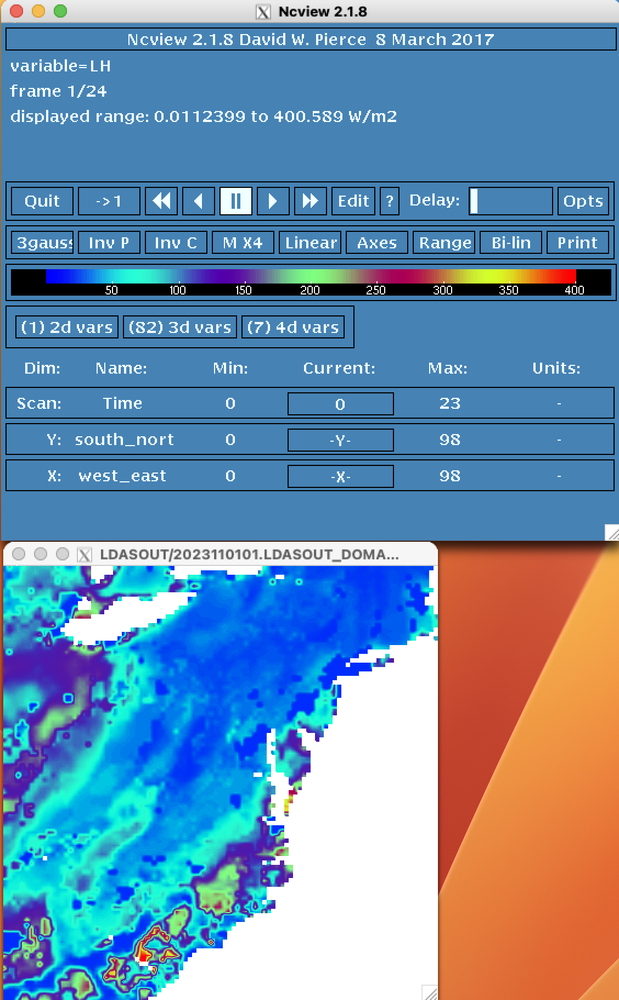

In [13]:
### Use Python code to visualize the results 

import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset

### Read in data
datain = Dataset("./2023110101.LDASOUT_DOMAIN1","r")
LHin = datain.variables["LH"][:]
print(np.shape(LHin))

(24, 99, 99)


/var/folders/p_/5k6r90r14mqffl2x06llz2zw0000gn/T/ipykernel_8828/2618324986.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(5,5))


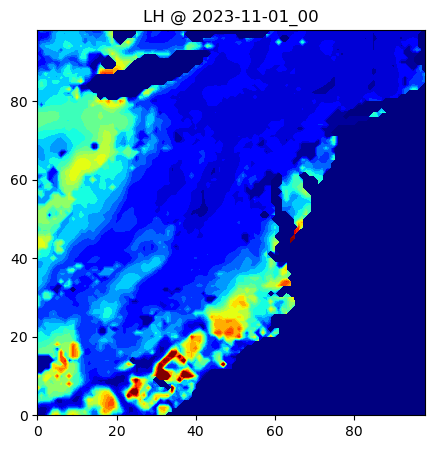

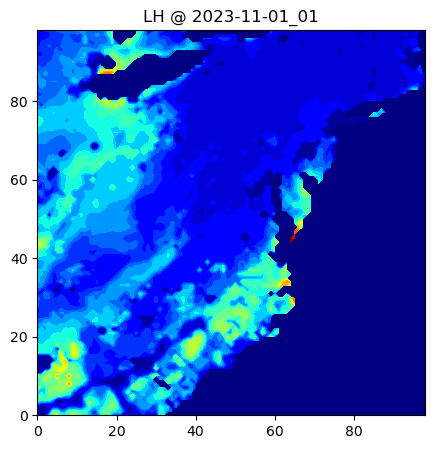

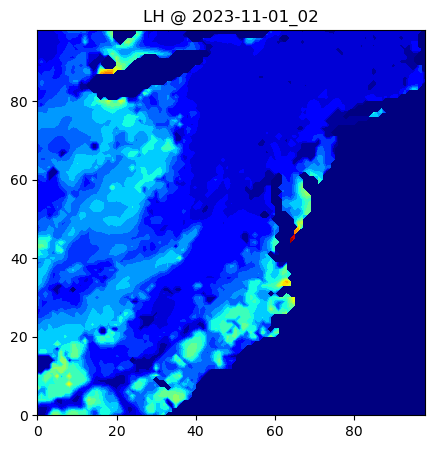

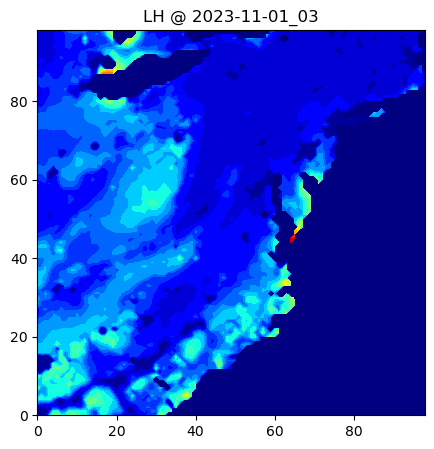

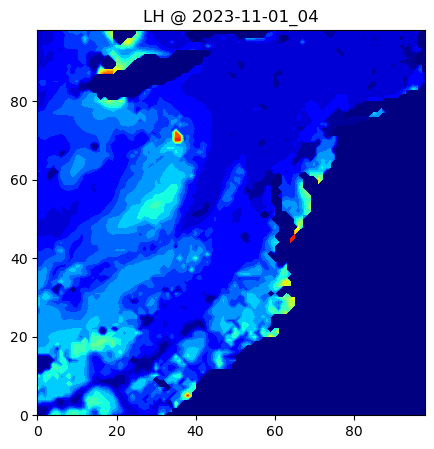

...

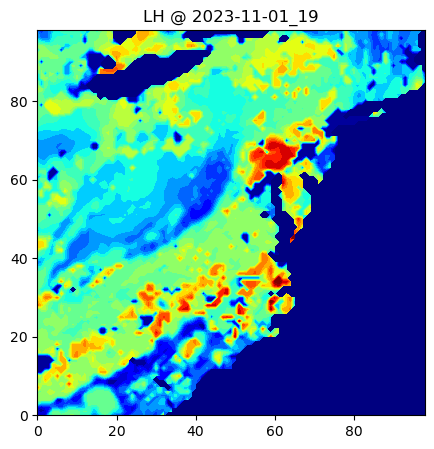

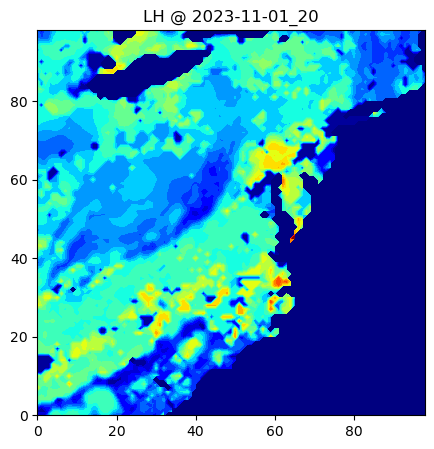

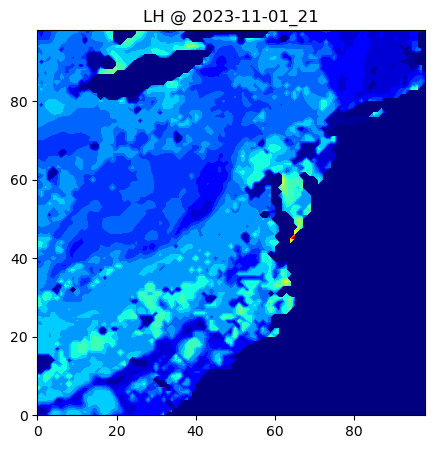

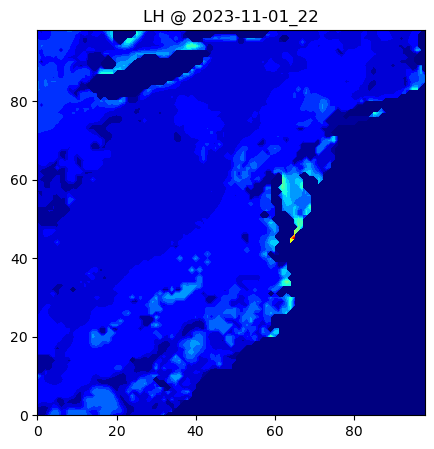

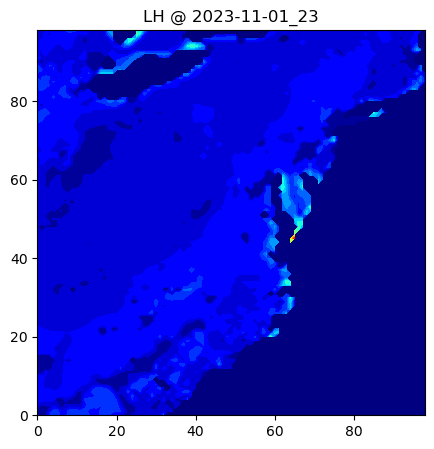

In [15]:
hour_str = ["00","01","02","03","04","05","06","07","08","09",
            "10","11","12","13","14","15","16","17","18","19",
            "20","21","22","23"]
for h in range(24):
    fig = plt.figure(figsize=(5,5))
    plt.contourf(LHin[h,:,:],levels=np.linspace(0,300,21),cmap="jet",extend="both")
    plt.title("LH @ 2023-11-01_"+hour_str[h])
    plt.savefig("ERA5-Land_Noah-MP_LH_2023-11-01_"+hour_str[h]+".png")

/var/folders/p_/5k6r90r14mqffl2x06llz2zw0000gn/T/ipykernel_8828/2970777019.py:15: FutureWarning: The input object of type 'PngImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'PngImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  print('image_arrays shape:', np.array(image_array).shape)
/var/folders/p_/5k6r90r14mqffl2x06llz2zw0000gn/T/ipykernel_8828/2970777019.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  print('image_arrays shape:', np.array(imag

image_arrays shape: (24,)


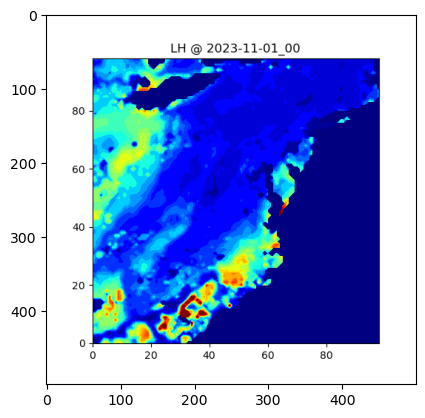

MovieWriter ffmpeg unavailable; using Pillow instead.


In [16]:
import glob

#read all the .png files in directory called `ERA5`
files = sorted(glob.glob(r"ERA5*.png"))

from PIL import Image

image_array = []

for my_file in files:
    
    image = Image.open(my_file)
    image_array.append(image)

print('image_arrays shape:', np.array(image_array).shape)

#image_arrays shape: (24,)

import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Create the figure and axes objects
fig, ax = plt.subplots()

# Set the initial image
im = ax.imshow(image_array[0], animated=True)

def update(i):
    im.set_array(image_array[i])
    return im, 

# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(image_array), interval=200, blit=True,repeat_delay=10,)

# Show the animation
plt.show()

animation_fig.save("ERA5-Land_Noah-MP_2023-11-01_LH.gif")

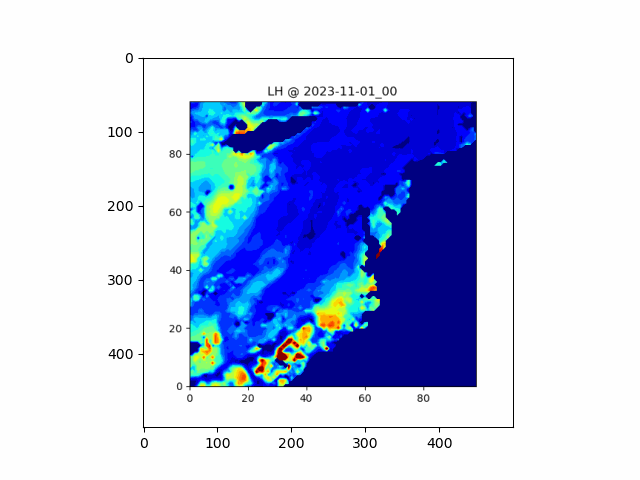

### Congratulations, you have successfully running the ERA5-Land data over the Eastern US Domain!